In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
import lightgbm as lgb
from collections import Counter
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error as mse
from sklearn.model_selection import GridSearchCV
import os
import sys

In [2]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

In [3]:
train = train.fillna('0')
test = test.fillna('0')

In [4]:
train.Date.min()

'2020-01-22'

In [5]:
test.shape

(12642, 4)

In [6]:
test.head()

,ForecastId,Province_State,Country_Region,Date
0,1,0,Afghanistan,2020-03-19
1,2,0,Afghanistan,2020-03-20
2,3,0,Afghanistan,2020-03-21
3,4,0,Afghanistan,2020-03-22
4,5,0,Afghanistan,2020-03-23


### EDA

In [7]:
train.Date = train.Date.apply(lambda x: x.replace('-',''))
train['Date']= pd.to_datetime(train.Date, format='%Y%m%d')

In [8]:
test.Date = test.Date.apply(lambda x: x.replace('-',''))
test['Date']= pd.to_datetime(test.Date, format='%Y%m%d')

In [9]:
bycountries = train.groupby(['Country_Region','Date']).agg({'ConfirmedCases':'sum', 
                         'Fatalities':'sum'}).reset_index()

C:\Users\mo63he\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


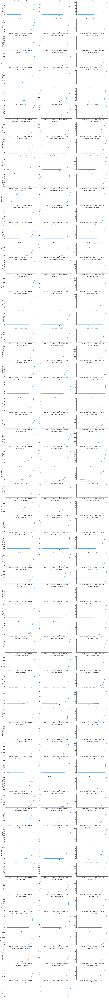

In [9]:
from matplotlib import rcParams
rcParams['figure.figsize'] = 11.7,8.27

sns.set(style="ticks", color_codes=True, font_scale=1.4)
g = sns.FacetGrid(bycountries, col='Country_Region', col_wrap=3, 
                  height=4, aspect = 2, dropna=False, sharex = False, sharey = False)
g = g.map(plt.plot, 'Date', 'ConfirmedCases',color = 'steelblue',
          linestyle = '-',
          label = 'positives').add_legend().set()
g.fig.tight_layout()

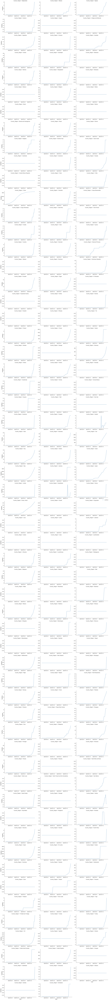

In [10]:
sns.set(style="ticks", color_codes=True, font_scale=1.4)
g = sns.FacetGrid(bycountries, col='Country_Region', col_wrap=3, 
                  height=4, aspect = 2, dropna=False, sharex = False, sharey = False)
g = g.map(plt.plot, 'Date', 'Fatalities',color = 'steelblue',
          linestyle = '-',
          label = 'positives').add_legend().set()
g.fig.tight_layout()

Looks like the increase is exponential, I will transform the target variable to make to more stable

### Feature Generation

In [10]:
first_case_per_cntry_state = train[(train['ConfirmedCases'] > 0)].groupby(['Country_Region', 'Province_State'])['Date'].min().reset_index()
first_death_per_cntry_state = train[(train['Fatalities'] > 0)].groupby(['Country_Region', 'Province_State'])['Date'].min().reset_index()

In [11]:
first_case_per_cntry_state = first_case_per_cntry_state.rename(columns = {'Date': 'first_case_per_cntry_state'})
first_death_per_cntry_state = first_death_per_cntry_state.rename(columns = {'Date': 'first_death_per_cntry_state'})


In [12]:
train_lags = train[['Province_State', 'Country_Region', 'Date', 'ConfirmedCases',
       'Fatalities']]

In [13]:
for i in range(1, 2):
    train_lags['date_lag_' + str(i)] = train_lags['Date'] + pd.to_timedelta(i,unit='D')

In [14]:
train_lags = train_lags.rename(columns = {'ConfirmedCases': 'ConfirmedCases_lagged',
                                         'Fatalities': 'Fatalities_lagged'})

In [15]:
for i in range (1, 2):
    train = train.merge(train_lags[['ConfirmedCases_lagged', 'Fatalities_lagged', 'date_lag_' + str(i), 'Country_Region', 'Province_State']],
                how = 'left',
                left_on = ['Country_Region', 'Province_State', 'Date'],
                right_on = ['Country_Region', 'Province_State', 'date_lag_' + str(i)])
    train = train.rename(columns = {'ConfirmedCases_lagged': 'ConfirmedCases_lagged_' + str(i),
                                   'Fatalities_lagged': 'Fatalities_lagged_' + str(i)})

In [16]:
train = train.merge(first_case_per_cntry_state, left_on = ['Country_Region', 'Province_State'],
                    right_on = ['Country_Region', 'Province_State'])
train = train.merge(first_death_per_cntry_state, left_on = ['Country_Region', 'Province_State'],
                    right_on = ['Country_Region', 'Province_State'], how = 'left')


In [17]:
train['time_since_first_death_per_cntry_state'] = train['Date'] - train['first_death_per_cntry_state']

train['time_since_first_case_per_cntry_state'] = train['Date'] - train['first_case_per_cntry_state']


In [18]:
cols = ['time_since_first_death_per_cntry_state',
       'time_since_first_case_per_cntry_state']
for col in cols:
    train[col] = train[col].dt.days.clip(0,train[col].dt.days.max())

In [19]:
train = train.fillna(0)
test = test.fillna(0)

In [20]:
train['cntry_and_states'] = train['Country_Region'] + '_' + train['Province_State']

In [21]:
test['cntry_and_states'] = test['Country_Region'] + '_' + test['Province_State']

In [22]:
train['dff_last_1d_confirmed'] = train[ 'ConfirmedCases'] / train[ 'ConfirmedCases_lagged_1']
train['dff_last_1d_fatalities'] = train[ 'Fatalities'] / train[ 'Fatalities_lagged_1']
train = train.fillna(0)
train['dff_last_1d_confirmed'] = np.log(train['dff_last_1d_confirmed'] + 1)
train['dff_last_1d_fatalities'] = np.log(train['dff_last_1d_fatalities'] + 1)

In [22]:
sns.set(style="ticks", color_codes=True, font_scale=1.4)
g = sns.FacetGrid(train[train['time_since_first_case_per_cntry_state'] > 0], col='cntry_and_states', col_wrap=3, 
                  height=4, aspect = 2, dropna=False, sharex = True, sharey = False)
g = g.map(plt.plot, 'Date', 'dff_last_1d_confirmed',color = 'steelblue',
          linestyle = '-',
          label = 'positives').add_legend().set()

g = g.map(plt.plot, 'Date', 'dff_last_1d_fatalities',color = 'orange',
          linestyle = '-',
          label = 'fatalities').add_legend().set()
g.fig.tight_layout()

C:\Users\mo63he\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


In [23]:
from numpy import inf
train = train.replace(inf, 0)

In [24]:
mean_per_cntry_states = train.groupby('cntry_and_states')[[ 'dff_last_1d_confirmed', 'dff_last_1d_fatalities']].mean().reset_index()

In [25]:
mean_per_cntry_states = mean_per_cntry_states.rename(columns = {
     'dff_last_1d_confirmed': 'mean_enclosed_log_cases',
    'dff_last_1d_fatalities': 'mean_enclosed_log_fatalities'
})

In [26]:
train = train.merge(mean_per_cntry_states)

In [27]:
train = train[['Id', 'Date', 'ConfirmedCases', 'Fatalities',
                'time_since_first_death_per_cntry_state',
       'time_since_first_case_per_cntry_state', 'cntry_and_states',
       'dff_last_1d_confirmed', 'dff_last_1d_fatalities',
       'mean_enclosed_log_cases', 'mean_enclosed_log_fatalities']]

In [28]:
train_lags = train[['cntry_and_states', 'Date', 'dff_last_1d_confirmed',
       'dff_last_1d_fatalities']]

In [29]:
for i in range(1, 8):
    train_lags['date_lag_' + str(i)] = train_lags['Date'] + pd.to_timedelta(i,unit='D')

C:\Users\mo63he\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [30]:
train_lags = train_lags.rename(columns = {'dff_last_1d_confirmed': 'dff_last_1d_confirmed_lagged',
                                         'dff_last_1d_fatalities': 'dff_last_1d_fatalities_lagged'})

for i in range (1, 8):
    train = train.merge(train_lags[['dff_last_1d_confirmed_lagged', 'dff_last_1d_fatalities_lagged', 'date_lag_' + str(i),
                                    'cntry_and_states']],
                how = 'left',
                left_on = ['cntry_and_states', 'Date'],
                right_on = ['cntry_and_states', 'date_lag_' + str(i)])
    train = train.rename(columns = {'dff_last_1d_confirmed_lagged': 'dff_last_1d_confirmed_lagged_' + str(i),
                                   'dff_last_1d_fatalities_lagged': 'dff_last_1d_fatalities_lagged_' + str(i)})

In [31]:
rolls_per_cntry_states = train.set_index('Date').groupby(['cntry_and_states'])[[ 'dff_last_1d_confirmed',
                                                       'dff_last_1d_fatalities']].rolling('7D').mean().reset_index()

In [32]:
rolls_per_cntry_states = rolls_per_cntry_states.rename(columns = {
     'dff_last_1d_confirmed': '7d_roll_mean_log_cases',
    'dff_last_1d_fatalities': '7d_roll_mean_log_fatalities'
})

In [33]:
train = train.merge(rolls_per_cntry_states)

In [34]:
train = train[['Id', 'Date', 'time_since_first_death_per_cntry_state',
       'time_since_first_case_per_cntry_state', 'cntry_and_states',
       'dff_last_1d_confirmed', 'dff_last_1d_fatalities', 'ConfirmedCases', 'Fatalities',
       'mean_enclosed_log_cases', 'mean_enclosed_log_fatalities',
       '7d_roll_mean_log_cases', '7d_roll_mean_log_fatalities',
       'dff_last_1d_confirmed_lagged_1', 'dff_last_1d_fatalities_lagged_1',
        'dff_last_1d_confirmed_lagged_2','dff_last_1d_fatalities_lagged_2',
       'dff_last_1d_confirmed_lagged_3', 'dff_last_1d_fatalities_lagged_3',
        'dff_last_1d_confirmed_lagged_4', 'dff_last_1d_fatalities_lagged_4',
       'dff_last_1d_confirmed_lagged_5', 'dff_last_1d_fatalities_lagged_5',
        'dff_last_1d_confirmed_lagged_6', 'dff_last_1d_fatalities_lagged_6',
       'dff_last_1d_confirmed_lagged_7', 'dff_last_1d_fatalities_lagged_7']]

In [35]:
train = train.fillna(0)

In [36]:
train = train.set_index(['Id', 'Date', 'cntry_and_states'])

In [37]:
train.query('Date <=  "2020-03-25"')[['dff_last_1d_confirmed']]

,,,dff_last_1d_confirmed
Id,Date,cntry_and_states,
1,2020-01-22,Afghanistan_0,0.000000
2,2020-01-23,Afghanistan_0,0.000000
3,2020-01-24,Afghanistan_0,0.000000
4,2020-01-25,Afghanistan_0,0.000000
5,2020-01-26,Afghanistan_0,0.000000
...,...,...,...
29360,2020-03-21,Zimbabwe_0,1.386294
29361,2020-03-22,Zimbabwe_0,0.693147
29362,2020-03-23,Zimbabwe_0,0.693147


In [38]:
y_train_1 = train.query('Date <  "2020-03-25"')['dff_last_1d_confirmed']
y_test_1 = train.query('Date >=  "2020-03-25"')['dff_last_1d_confirmed']

y_train_2 = train.query('Date <  "2020-03-25"')['dff_last_1d_fatalities']
y_test_2 = train.query('Date >=  "2020-03-25"')['dff_last_1d_fatalities']

X_train = train.query('Date <  "2020-03-25"').drop(columns = ['dff_last_1d_confirmed',
                                                                         'dff_last_1d_fatalities',
                                                                         'ConfirmedCases', 'Fatalities'])
X_test = train.query('Date >=  "2020-03-25"').drop(columns = ['dff_last_1d_confirmed',
                                                                         'dff_last_1d_fatalities',
                                                                         'ConfirmedCases', 'Fatalities'])

In [75]:
X_train.shape

(18522, 20)

In [39]:
#train.loc[(slice(None), slice(None), 'Italy_0'),:]

In [100]:
train_dmatrix_1 = xgb.DMatrix(data=X_train, label=y_train_1.values.reshape(-1,1))
test_dmatrix_1 = xgb.DMatrix(data=X_test, label=y_test_1.values.reshape(-1,1))

In [101]:
X_train.shape, X_test.shape

((18522, 20), (882, 20))

[15:02:54] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.0.0\src\learner.cc:328: 
Parameters: { eval_set } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	eval_test-rmse:0.24484
Will train until eval_test-rmse hasn't improved in 20 rounds.
[1]	eval_test-rmse:0.20220
[2]	eval_test-rmse:0.17061
[3]	eval_test-rmse:0.14632
[4]	eval_test-rmse:0.12809
[5]	eval_test-rmse:0.11587
[6]	eval_test-rmse:0.10833
[7]	eval_test-rmse:0.10115
[8]	eval_test-rmse:0.09677
[9]	eval_test-rmse:0.09428
[10]	eval_test-rmse:0.09014
[11]	eval_test-rmse:0.08884
[12]	eval_test-rmse:0.08662
[13]	eval_test-rmse:0.08633
[14]	eval_test-rmse:0.08608
[15]	eval_test-rmse:0.08575
[16]	eval_test-rmse:0.08556
[17]	eval_test-rmse:0.08510
[18]	eval_test-rmse:0.08453
[19]	eval_test-rmse:0.08455
[2

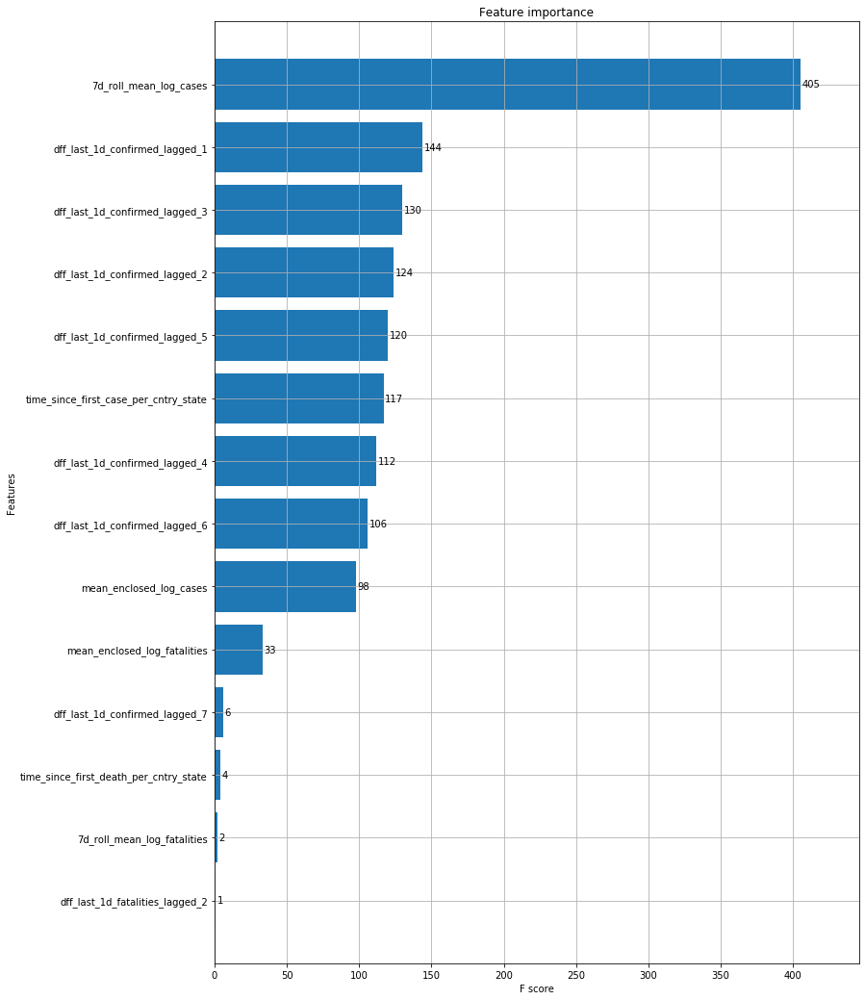

In [102]:
fit_params = {
    'eval_set': [(X_train, y_train_1),(X_test, y_test_1)],
    'max_depth': 10,
    'colsample_bytree': 0.8,
    'alpha': 1,
    'eta': 0.2,
    'subsample': 0.9,
    'gamma': 0.1,
    'min_child_weight': 0.5,
    'tree_method': 'exact'
}

xgb_model_1 = xgb.train(params= fit_params,
                 dtrain=train_dmatrix_1,
                              evals = [(test_dmatrix_1, 'eval_test')],
                             num_boost_round = 500 , early_stopping_rounds = 20)




fig, ax = plt.subplots(figsize=(12,18))
xgb.plot_importance(xgb_model_1, max_num_features=50,height=0.8, ax=ax)
plt.show()


In [104]:
train_dmatrix_2 = xgb.DMatrix(data=X_train, label=y_train_2)
test_dmatrix_2 = xgb.DMatrix(data=X_test, label=y_test_2)

[15:34:16] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.0.0\src\learner.cc:328: 
Parameters: { eval_set } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	eval_train-rmse:0.38199	eval_test-rmse:0.32810
Multiple eval metrics have been passed: 'eval_test-rmse' will be used for early stopping.

Will train until eval_test-rmse hasn't improved in 20 rounds.
[1]	eval_train-rmse:0.30668	eval_test-rmse:0.26985
[2]	eval_train-rmse:0.24668	eval_test-rmse:0.22411
[3]	eval_train-rmse:0.19887	eval_test-rmse:0.18817
[4]	eval_train-rmse:0.16107	eval_test-rmse:0.16169
[5]	eval_train-rmse:0.13132	eval_test-rmse:0.14311
[6]	eval_train-rmse:0.10772	eval_test-rmse:0.12944
[7]	eval_train-rmse:0.08958	eval_test-rmse:0.11891
[8]	eval_train-rmse:0.07472	eval_test-rmse:0.10989
[9

[147]	eval_train-rmse:0.02522	eval_test-rmse:0.08452
[148]	eval_train-rmse:0.02522	eval_test-rmse:0.08452
[149]	eval_train-rmse:0.02522	eval_test-rmse:0.08452
Stopping. Best iteration:
[129]	eval_train-rmse:0.02531	eval_test-rmse:0.08451



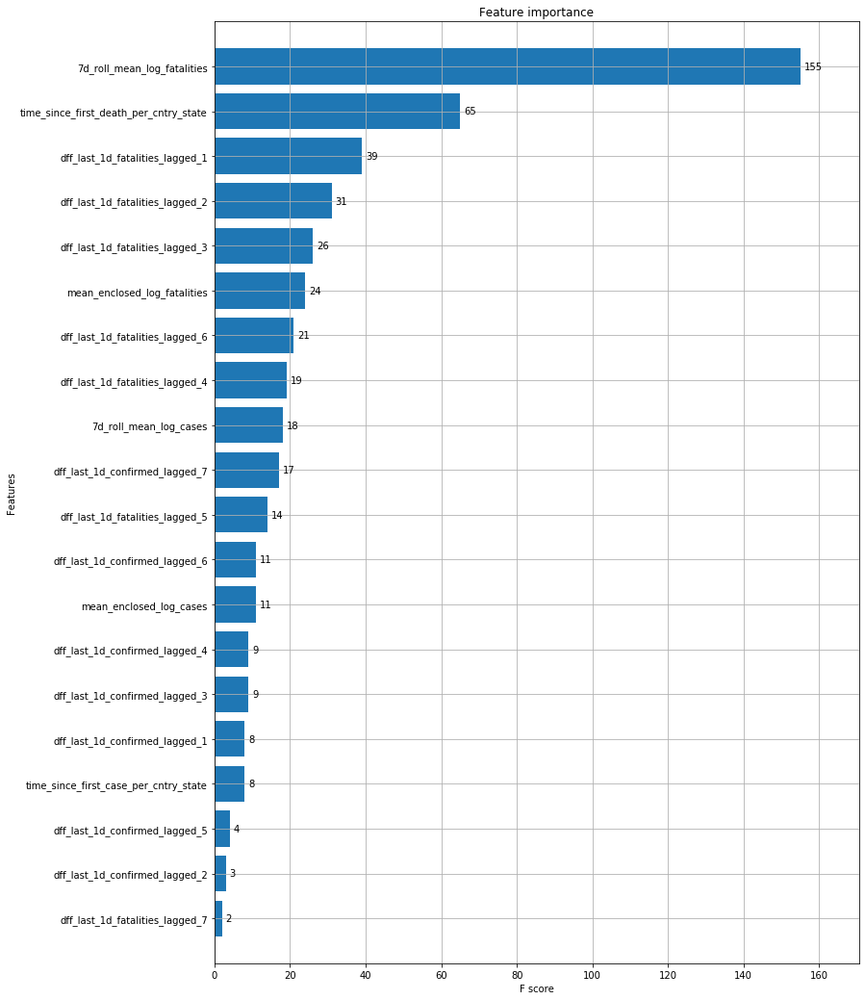

In [105]:
fit_params = {
    'eval_set': [(X_train, y_train_2),(X_test, y_test_2)],
    'max_depth': 10,
    'colsample_bytree': 0.8,
    'alpha': 1,
    'eta': 0.2,
    'subsample': 0.9,
    'gamma': 0.1,
    'min_child_weight': 0.5,
    'tree_method': 'exact'
}

xgb_model_2 = xgb.train(params= fit_params,
                 dtrain=train_dmatrix_2,
                              evals = [(train_dmatrix_2, 'eval_train'),(test_dmatrix_2, 'eval_test')],
                             num_boost_round = 500 , early_stopping_rounds = 20)




fig, ax = plt.subplots(figsize=(12,18))
xgb.plot_importance(xgb_model_2, max_num_features=50,height=0.8, ax=ax)
plt.show()


In [111]:
xgb_model_1.predict(xgb.DMatrix(data = X_train), ntree_limit=xgb_model_1.best_ntree_limit)
#train['pred_fatalities'] = xgb_model_2.predict(xgb.DMatrix(data = X_train))

array([-4.7385693e-05, -4.7385693e-05, -4.7385693e-05, ...,
        6.7100525e-01,  7.2671187e-01,  7.3839444e-01], dtype=float32)

In [112]:
y_test_1.isnull().sum()

0

### Prediction Routine

In [113]:
in_future = train.reset_index().sort_values('Date').groupby('cntry_and_states').tail(10)
future_dates  = list(set(test.Date).difference(in_future.Date))
test['Date_check'] = test['Date'].apply(lambda x: x in future_dates)

dates = test[test['Date_check']  == True]['Date'].unique()

appended = in_future.copy()
for date in dates:
    to_be_appended  = test[(test['Date']  == date)]
    
    print(date)
    appended = appended.append(to_be_appended)
    appended = appended.drop(columns = ['Date_check'])
    #appended = appended[appended.cntry_and_states == 'Afghanistan_0']

    selected_cols_case = [col for col in appended if 'last_1d_confirmed' in col]
    selected_cols_fatal = [col for col in appended if 'last_1d_fatal' in col]
    missings = appended.loc[appended['dff_last_1d_confirmed'].isnull(),:]
    selected_cols_case.extend(['Date', 'cntry_and_states'])
    selected_cols_fatal.extend(['Date', 'cntry_and_states'])
    
    most_recents = appended[appended['dff_last_1d_confirmed'].notnull()].groupby(['cntry_and_states'])['Date'].max().reset_index()
    most_recents = most_recents.merge(appended)[selected_cols_case + selected_cols_fatal[:-2]]
    
    
    most_recents = most_recents.sort_values('cntry_and_states')
    missings = missings.sort_values('cntry_and_states').reset_index()
    
    imputed_cols = selected_cols_case[1:-2]
    for imp, col in zip(imputed_cols, selected_cols_case[:-3]):
        missings[imp] =most_recents[col]
    
    imputed_cols = selected_cols_fatal[1:-2]
    for imp, col in zip(imputed_cols, selected_cols_fatal[:-3]):
        missings[imp] = most_recents[col]
        
    missings = missings.set_index('index')
    appended.loc[appended['dff_last_1d_confirmed'].isnull(),
             selected_cols_case[:-2] + selected_cols_fatal[:-2]] = missings[selected_cols_case[:-2] + selected_cols_fatal[:-2]]
   
    rolls_for_future = appended.set_index('Date').groupby(['cntry_and_states'])[[ 'dff_last_1d_confirmed',
                                                       'dff_last_1d_fatalities']].rolling('7D').mean().reset_index()
    rolls_for_future = rolls_for_future.rename(columns = {'dff_last_1d_confirmed': '7d_roll_mean_log_cases_upd',
                                                      'dff_last_1d_fatalities': '7d_roll_mean_log_fatalities_upd'})
    
    
    

    appended.loc[appended['7d_roll_mean_log_cases'].isnull(),
             ['7d_roll_mean_log_cases',
              '7d_roll_mean_log_fatalities']] = rolls_for_future.loc[rolls_for_future.Date == date,
                                                                 ['7d_roll_mean_log_cases_upd',
                                                                  '7d_roll_mean_log_fatalities_upd']].values
    
 
    
    temp = appended[appended['time_since_first_death_per_cntry_state'].notnull()]
    temp = temp.loc[temp.Date == temp.Date.max(), ['cntry_and_states',
                                            'Date','time_since_first_case_per_cntry_state',
                                            'time_since_first_death_per_cntry_state']].sort_values('cntry_and_states')

    temp['time_since_first_case_per_cntry_state'] = temp['time_since_first_case_per_cntry_state'] + 1
    temp['time_since_first_death_per_cntry_state'] = temp['time_since_first_death_per_cntry_state'] + 1
    temp = temp.reset_index()
    appended.loc[appended['time_since_first_death_per_cntry_state'].isnull(),
         ['time_since_first_case_per_cntry_state',
          'time_since_first_death_per_cntry_state']] =  temp[['time_since_first_case_per_cntry_state',
                                        'time_since_first_death_per_cntry_state']].values

    appended.loc[appended['mean_enclosed_log_cases'].isnull(),
         ['mean_enclosed_log_cases',
          'mean_enclosed_log_fatalities']] =  mean_per_cntry_states[['mean_enclosed_log_cases',
                                                                     'mean_enclosed_log_fatalities']].values
    
    appended['pred_pos_cases'] = xgb_model_1.predict(xgb.DMatrix( data = appended[['time_since_first_death_per_cntry_state',
       'time_since_first_case_per_cntry_state', 'mean_enclosed_log_cases',
       'mean_enclosed_log_fatalities', '7d_roll_mean_log_cases',
       '7d_roll_mean_log_fatalities', 'dff_last_1d_confirmed_lagged_1',
       'dff_last_1d_fatalities_lagged_1', 'dff_last_1d_confirmed_lagged_2',
       'dff_last_1d_fatalities_lagged_2', 'dff_last_1d_confirmed_lagged_3',
       'dff_last_1d_fatalities_lagged_3', 'dff_last_1d_confirmed_lagged_4',
       'dff_last_1d_fatalities_lagged_4', 'dff_last_1d_confirmed_lagged_5',
       'dff_last_1d_fatalities_lagged_5', 'dff_last_1d_confirmed_lagged_6',
       'dff_last_1d_fatalities_lagged_6', 'dff_last_1d_confirmed_lagged_7',
       'dff_last_1d_fatalities_lagged_7']]))
    
    appended['pred_fatalities'] = xgb_model_2.predict(xgb.DMatrix(data = appended[['time_since_first_death_per_cntry_state',
       'time_since_first_case_per_cntry_state', 'mean_enclosed_log_cases',
       'mean_enclosed_log_fatalities', '7d_roll_mean_log_cases',
       '7d_roll_mean_log_fatalities', 'dff_last_1d_confirmed_lagged_1',
       'dff_last_1d_fatalities_lagged_1', 'dff_last_1d_confirmed_lagged_2',
       'dff_last_1d_fatalities_lagged_2', 'dff_last_1d_confirmed_lagged_3',
       'dff_last_1d_fatalities_lagged_3', 'dff_last_1d_confirmed_lagged_4',
       'dff_last_1d_fatalities_lagged_4', 'dff_last_1d_confirmed_lagged_5',
       'dff_last_1d_fatalities_lagged_5', 'dff_last_1d_confirmed_lagged_6',
       'dff_last_1d_fatalities_lagged_6', 'dff_last_1d_confirmed_lagged_7',
       'dff_last_1d_fatalities_lagged_7']]))
    
    appended['dff_last_1d_confirmed'] = appended['dff_last_1d_confirmed'].fillna(appended['pred_pos_cases'])
    appended['dff_last_1d_fatalities'] = appended['dff_last_1d_fatalities'].fillna(appended['pred_fatalities'])

2020-03-28T00:00:00.000000000


C:\Users\mo63he\anaconda3\lib\site-packages\pandas\core\frame.py:7123: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


2020-03-29T00:00:00.000000000
2020-03-30T00:00:00.000000000
2020-03-31T00:00:00.000000000
2020-04-01T00:00:00.000000000
2020-04-02T00:00:00.000000000
2020-04-03T00:00:00.000000000
2020-04-04T00:00:00.000000000
2020-04-05T00:00:00.000000000
2020-04-06T00:00:00.000000000
2020-04-07T00:00:00.000000000
2020-04-08T00:00:00.000000000
2020-04-09T00:00:00.000000000
2020-04-10T00:00:00.000000000
2020-04-11T00:00:00.000000000
2020-04-12T00:00:00.000000000
2020-04-13T00:00:00.000000000
2020-04-14T00:00:00.000000000
2020-04-15T00:00:00.000000000
2020-04-16T00:00:00.000000000
2020-04-17T00:00:00.000000000
2020-04-18T00:00:00.000000000
2020-04-19T00:00:00.000000000
2020-04-20T00:00:00.000000000
2020-04-21T00:00:00.000000000
2020-04-22T00:00:00.000000000
2020-04-23T00:00:00.000000000
2020-04-24T00:00:00.000000000
2020-04-25T00:00:00.000000000
2020-04-26T00:00:00.000000000
2020-04-27T00:00:00.000000000
2020-04-28T00:00:00.000000000
2020-04-29T00:00:00.000000000
2020-04-30T00:00:00.000000000


In [127]:
appended['pred_pos_cases'] = np.exp(appended['pred_pos_cases']) - 1
appended['pred_fatalities'] = np.exp(appended['pred_fatalities']) - 1

appended['pred_pos_cases'] = appended['pred_pos_cases'].clip(1,appended['pred_pos_cases'].max())
appended['pred_fatalities'] = appended['pred_fatalities'].clip(1,appended['pred_fatalities'].max())

In [128]:
cntrys = appended.cntry_and_states.unique()
for cntry in cntrys:
    print(cntry)
    confirmed_cases = appended.loc[((appended['ConfirmedCases'].isna() == False) & (appended['cntry_and_states'] == cntry)),
                                   ['ConfirmedCases', 'Date']]
    start_case = confirmed_cases[confirmed_cases['Date'] == confirmed_cases['Date'].min()][['ConfirmedCases']].values
    start_case = float(start_case)
    case_rates = appended.loc[appended['cntry_and_states'] == cntry,
                                   ['pred_pos_cases']].values
    pred_cases = []
    cum_rate = case_rates[1]
    for rate in case_rates[1:]:
        if rate == cum_rate:
            pred = start_case * cum_rate
        else:
            cum_rate = rate*cum_rate
            pred = start_case * cum_rate 
        pred_cases.append(pred[0])
    appended.loc[(appended.cntry_and_states == cntry) & (appended.Date > appended.Date.min()),'ConfirmedCases'] = pred_cases

US_New Mexico
US_Oregon
Hungary_0
Australia_Australian Capital Territory
Iceland_0
China_Hebei
France_Reunion
China_Yunnan
Armenia_0
Netherlands_Aruba
Zimbabwe_0
US_Pennsylvania
Germany_0
US_Florida
Uruguay_0
Switzerland_0
Ghana_0
Greece_0
Chile_0
Canada_Manitoba
China_Beijing
Serbia_0
Canada_New Brunswick
Netherlands_Sint Maarten
China_Xinjiang
US_Montana
US_New Jersey
Costa Rica_0
Nigeria_0
Monaco_0
Afghanistan_0
Netherlands_Curacao
Congo (Kinshasa)_0
China_Anhui
US_Colorado
China_Hainan
Angola_0
Morocco_0
New Zealand_0
Haiti_0
Canada_Saskatchewan
Venezuela_0
China_Guangxi
Guinea_0
Canada_Ontario
Croatia_0
Sudan_0
Singapore_0
Antigua and Barbuda_0
Congo (Brazzaville)_0
Namibia_0
France_St Martin
Gambia_0
China_Gansu
China_Zhejiang
Slovenia_0
Canada_Prince Edward Island
US_Delaware
Canada_Quebec
Cuba_0
US_North Dakota
Suriname_0
China_Guangdong
Guyana_0
Slovakia_0
Mozambique_0
US_Guam
Colombia_0
Nicaragua_0
Gabon_0
US_Ohio
United Kingdom_Montserrat
Guinea-Bissau_0
Andorra_0
France_0
S

In [129]:
for cntry in cntrys:
    print(cntry)
    confirmed_cases = appended.loc[((appended['Fatalities'].isna() == False) & (appended['cntry_and_states'] == cntry)),
                                   ['Fatalities', 'Date']]
    start_case = confirmed_cases[confirmed_cases['Date'] == confirmed_cases['Date'].min()][['Fatalities']].values
    start_case = float(start_case)
    case_rates = appended.loc[appended['cntry_and_states'] == cntry,
                                   ['pred_fatalities']].values
    pred_cases = []
    cum_rate = case_rates[1]
    for rate in case_rates[1:]:
        if rate == cum_rate:
            pred = start_case * cum_rate
        else:
            cum_rate = rate*cum_rate
            pred = start_case * cum_rate 
        pred_cases.append(pred[0])
    appended.loc[(appended.cntry_and_states == cntry) & (appended.Date > appended.Date.min()),'Fatalities'] = pred_cases

US_New Mexico
US_Oregon
Hungary_0
Australia_Australian Capital Territory
Iceland_0
China_Hebei
France_Reunion
China_Yunnan
Armenia_0
Netherlands_Aruba
Zimbabwe_0
US_Pennsylvania
Germany_0
US_Florida
Uruguay_0
Switzerland_0
Ghana_0
Greece_0
Chile_0
Canada_Manitoba
China_Beijing
Serbia_0
Canada_New Brunswick
Netherlands_Sint Maarten
China_Xinjiang
US_Montana
US_New Jersey
Costa Rica_0
Nigeria_0
Monaco_0
Afghanistan_0
Netherlands_Curacao
Congo (Kinshasa)_0
China_Anhui
US_Colorado
China_Hainan
Angola_0
Morocco_0
New Zealand_0
Haiti_0
Canada_Saskatchewan
Venezuela_0
China_Guangxi
Guinea_0
Canada_Ontario
Croatia_0
Sudan_0
Singapore_0
Antigua and Barbuda_0
Congo (Brazzaville)_0
Namibia_0
France_St Martin
Gambia_0
China_Gansu
China_Zhejiang
Slovenia_0
Canada_Prince Edward Island
US_Delaware
Canada_Quebec
Cuba_0
US_North Dakota
Suriname_0
China_Guangdong
Guyana_0
Slovakia_0
Mozambique_0
US_Guam
Colombia_0
Nicaragua_0
Gabon_0
US_Ohio
United Kingdom_Montserrat
Guinea-Bissau_0
Andorra_0
France_0
S

In [130]:
predictions = appended[['cntry_and_states','Date', 'ConfirmedCases','Fatalities']]

In [ ]:
pd.set_option('display.float_format', lambda x: '%.1f' % x)
for cntry in predictions['cntry_and_states']:
    predictions[predictions.cntry_and_states == cntry].plot(x = 'Date', y = 'ConfirmedCases', kind = 'line')
    plt.yscale("log")
plt.show()

In [85]:
test.merge(predictions)[['ForecastId', 'ConfirmedCases', 'Fatalities']]

,ForecastId,ConfirmedCases,Fatalities
0,1,22.000,0.000
1,2,24.000,0.000
2,3,24.000,0.000
3,4,40.000,0.000
4,5,40.000,0.000
...,...,...,...
12637,12638,0.000,0.000
12638,12639,0.000,0.000
12639,12640,0.000,0.000
12640,12641,0.000,0.000
